In [1]:
import timeit

code = """[4, 2, 3, 1, 5].sort()"""

execution_time = timeit.timeit(code, number=1)

print(execution_time)

1.3615936040878296e-06


In [2]:
cd Mask_RCNN/samples/nucleus

[Errno 2] No such file or directory: 'Mask_RCNN/samples/nucleus'
/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/samples/nucleus


In [1]:
import tensorflow as tf
tf.__version__

'1.15.0'

In [1]:
%%time
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import vesicle

%matplotlib inline 

# Directory to save logs and trained model
LOGS_DIR = os.path.join(ROOT_DIR, "logs")

import pandas as pd

Using TensorFlow backend.


CPU times: user 3.88 s, sys: 1.73 s, total: 5.61 s
Wall time: 3.25 s


In [2]:
ROOT_DIR

'/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN'

In [3]:
import tensorflow as tf

tf.test.is_gpu_available()

True

In [5]:
# Comment out to reload imported modules if they change
# %load_ext autoreload
# %autoreload 2

## Configurations

In [4]:
# Dataset directory
# DATASET_DIR = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/EM_Data'
# DATASET_DIR = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo'
DATASET_DIR = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/'
# DATASET_DIR = '/src/'
# Inference Configuration
config = vesicle.NucleusInferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        1000
DETECTION_MIN_CONFIDENCE       0
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

## Notebook Preferences

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"

In [6]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

## Load Validation Dataset

In [7]:
print(DATASET_DIR)

/allen/programs/braintv/workgroups/neuralcoding/Parastoo/


In [8]:
# Load validation dataset
dataset = vesicle.NucleusDataset()

# dataset.load_nucleus(DATASET_DIR, 'RL_shift')
# dataset.load_nucleus(DATASET_DIR, 'test333')
dataset.load_nucleus(DATASET_DIR, 'train250')
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 43
Classes: ['BG', 'vesicles', 'mitochondria']


10


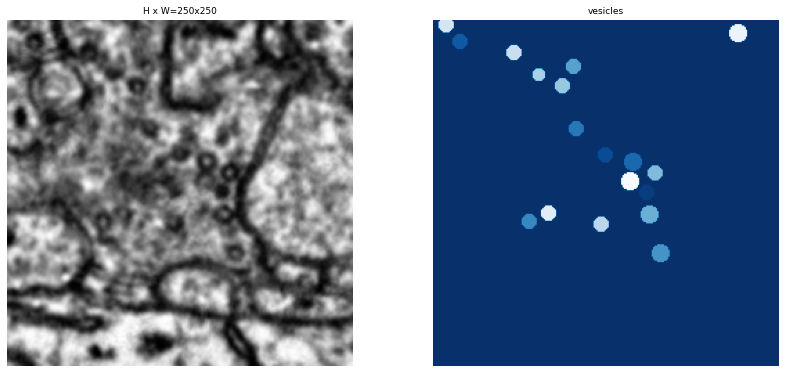

22


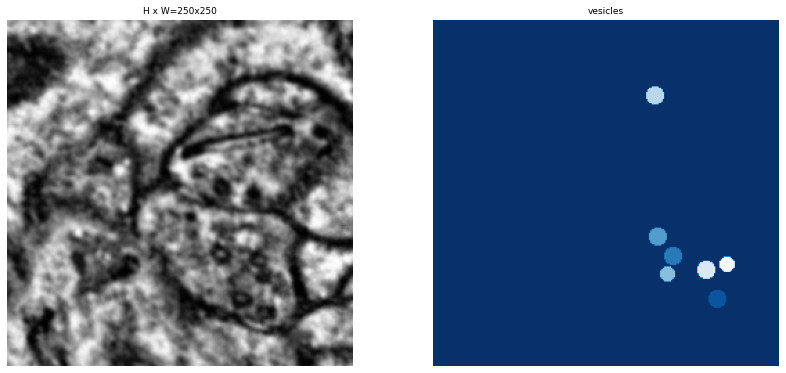

35


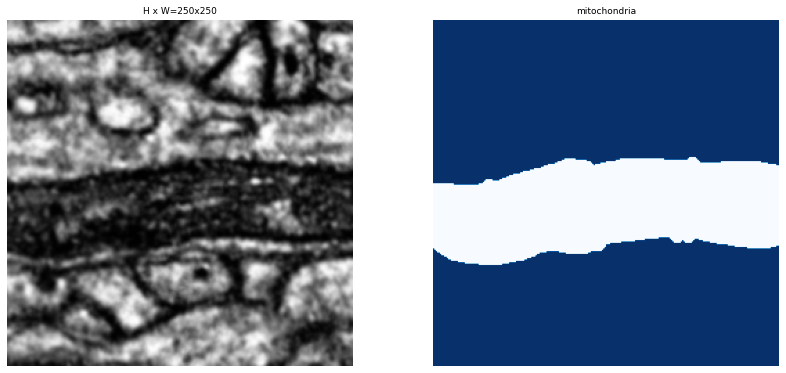

36


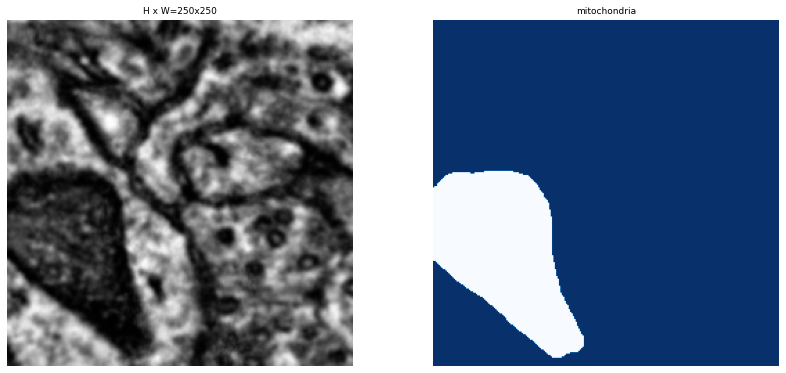

In [11]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    print(image_id)
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names, limit=1)

## Load Model

In [11]:
LOGS_DIR

'/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/logs'

In [12]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=LOGS_DIR,
                              config=config)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [ ]:
weights_path = model.find_last()
weights_path

In [16]:
# Path to a specific weights file
# weights_path = "/path/to/mask_rcnn_nucleus.h5"

# Or, load the last model you trained
# weights_path = model.find_last()

# weights_path ='/src/Mask_RCNN/samples/nucleus/logs/nucleus20201110T1132/mask_rcnn_nucleus_0079.h5'

weights_path ='/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/samples/nucleus/logs/nucleus20201123T2130/mask_rcnn_nucleus_0050.h5'
# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/samples/nucleus/logs/nucleus20201123T2130/mask_rcnn_nucleus_0050.h5






Re-starting from epoch 50


## SAMPLE DETECTION TEST

250_037
(250, 250, 3)


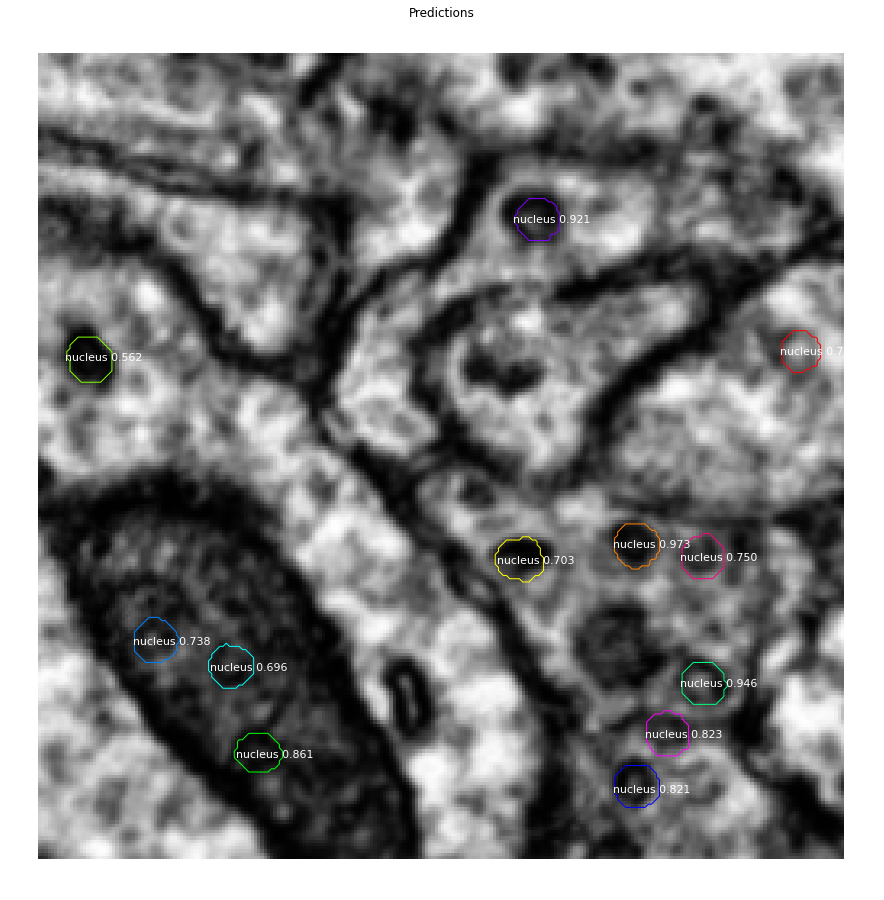

CPU times: user 3.63 s, sys: 590 ms, total: 4.22 s
Wall time: 4.56 s


<Figure size 432x288 with 0 Axes>

In [17]:
%%time
image_id = 5
image = dataset.load_image(image_id)
img_id = dataset.image_info[image_id]['id']
print(img_id)
# Detect objects
r = model.detect([image], verbose=0)[0]
print(image.shape)

visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=False,
            title="Predictions")

plt.show()
plt.savefig('detection_scores.png')

RL_020
(500, 500, 3)


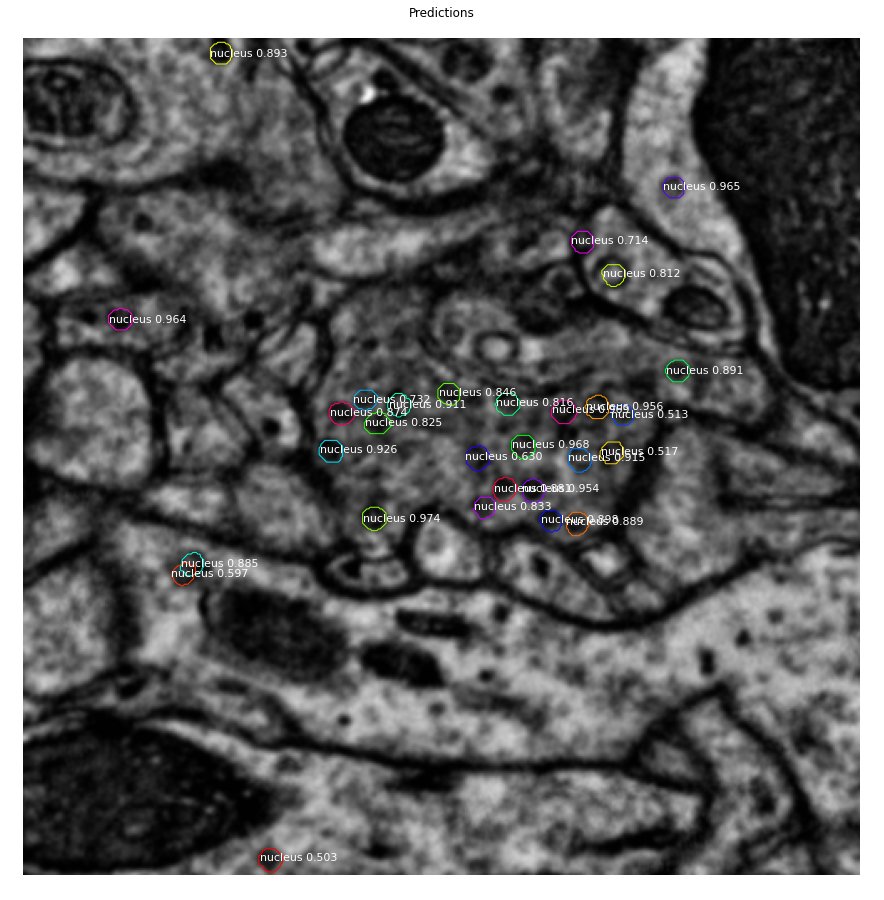

CPU times: user 44.5 s, sys: 751 ms, total: 45.3 s
Wall time: 24.2 s


<Figure size 432x288 with 0 Axes>

In [18]:
%%time
image_id = 2
image = dataset.load_image(image_id)
img_id = dataset.image_info[image_id]['id']
print(img_id)
# Detect objects
r = model.detect([image], verbose=0)[0]
print(image.shape)

visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=False,
            title="Predictions")

plt.show()
plt.savefig('detection_scores.png')


250_088
(250, 250, 3)


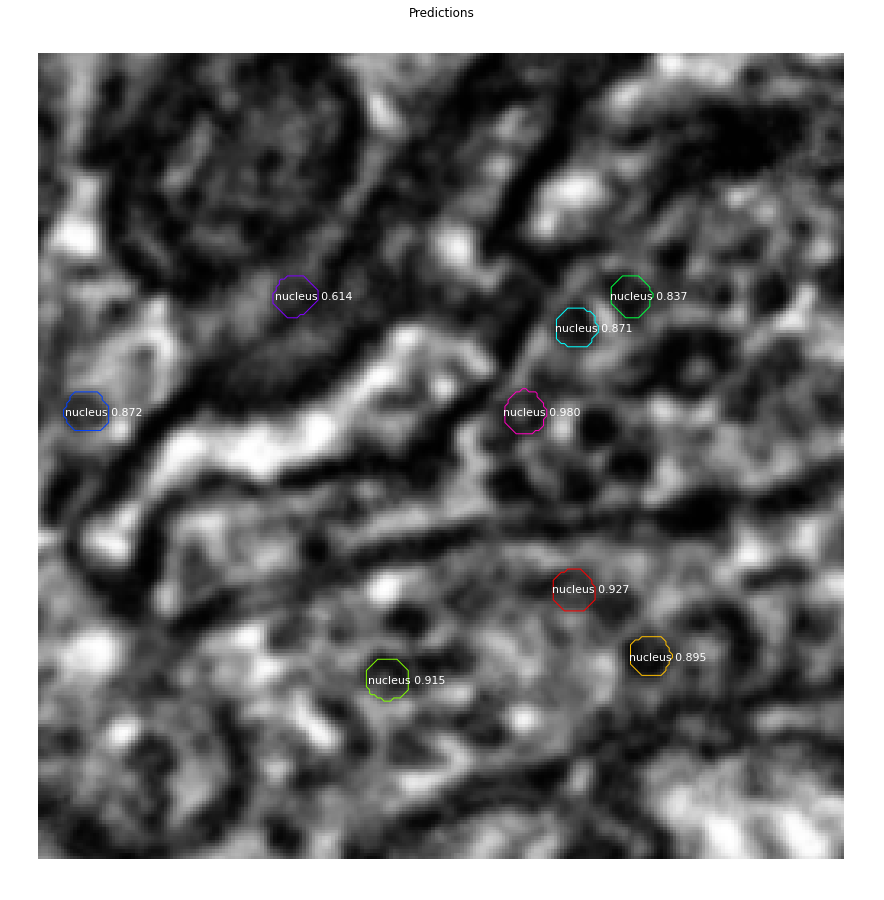

CPU times: user 418 ms, sys: 21 ms, total: 439 ms
Wall time: 497 ms


<Figure size 432x288 with 0 Axes>

In [23]:
%%time
image_id = 2
image = dataset.load_image(image_id)
img_id = dataset.image_info[image_id]['id']
print(img_id)
# Detect objects
r = model.detect([image], verbose=0)[0]
print(image.shape)


visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=False,
            title="Predictions")


plt.show()
plt.savefig('detection_scores.png')

Running on /allen/programs/braintv/workgroups/neuralcoding/Parastoo/


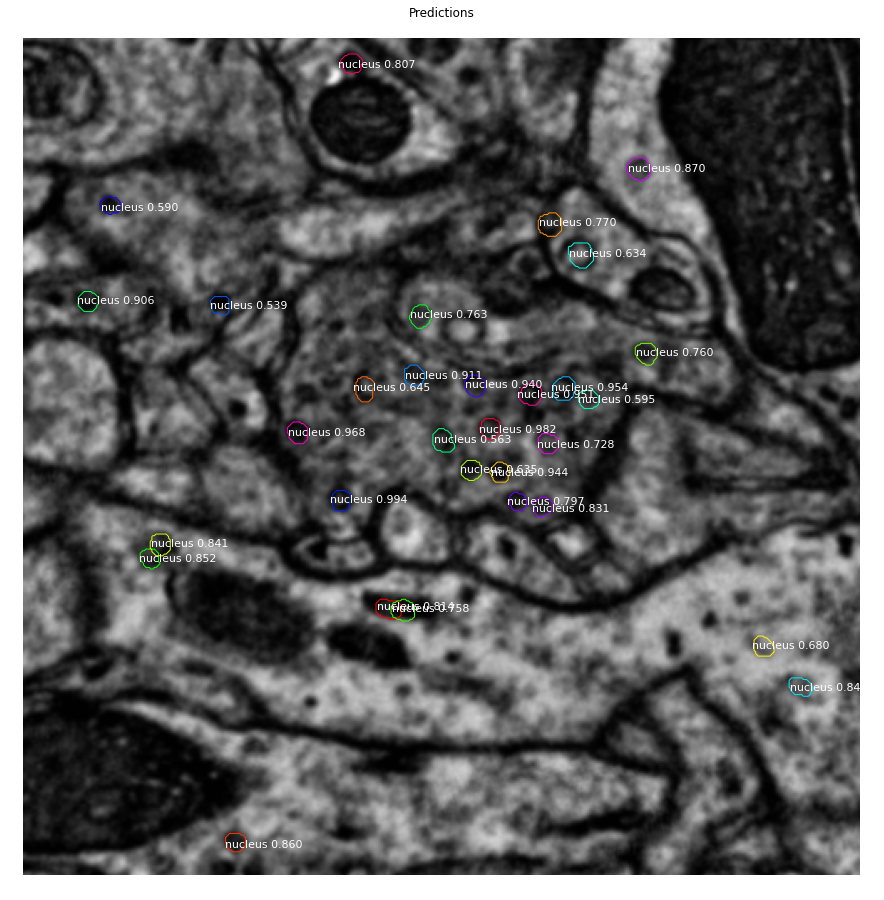

<Figure size 432x288 with 0 Axes>

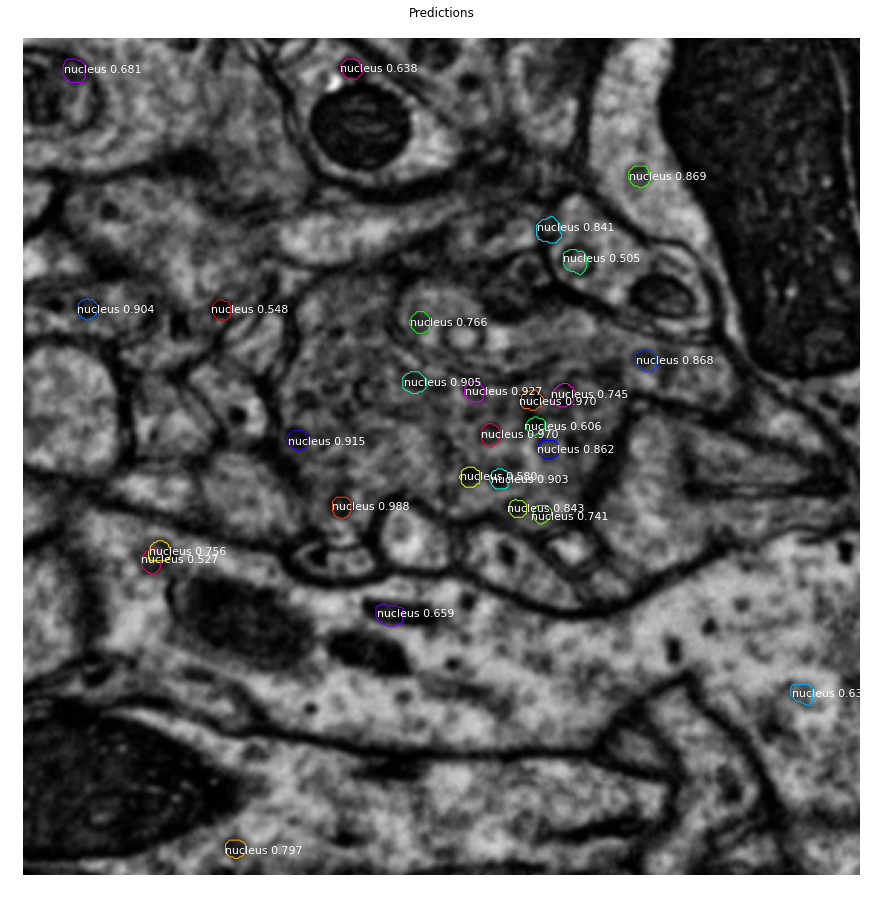

<Figure size 432x288 with 0 Axes>

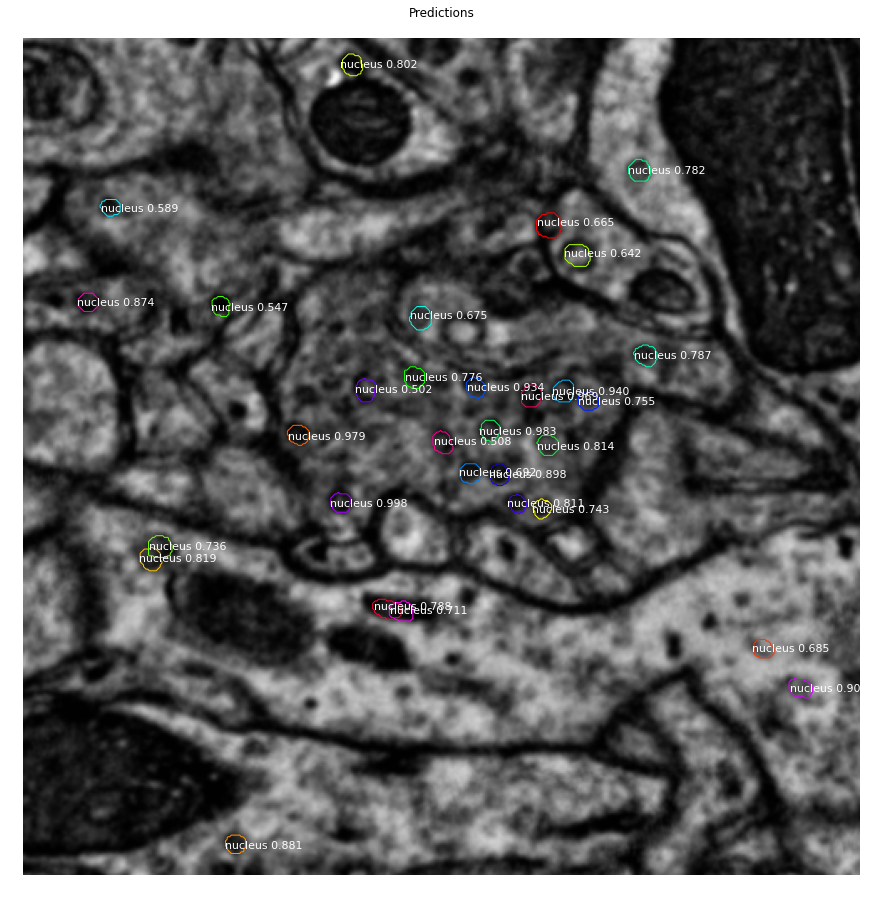

<Figure size 432x288 with 0 Axes>

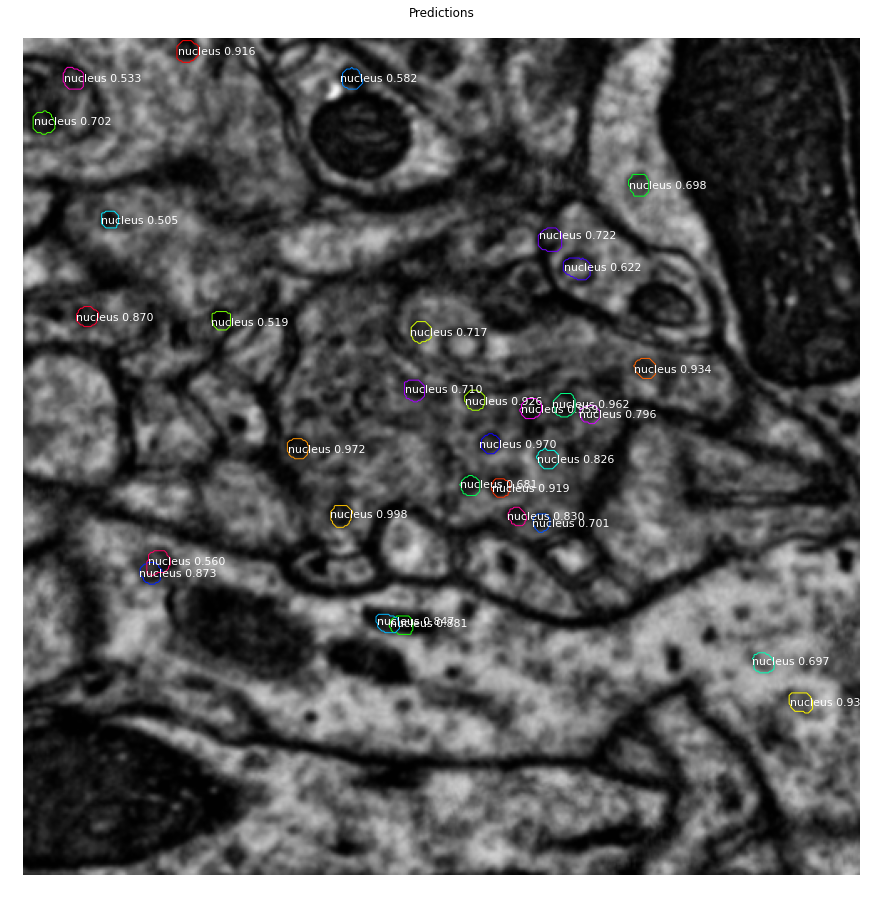

<Figure size 432x288 with 0 Axes>

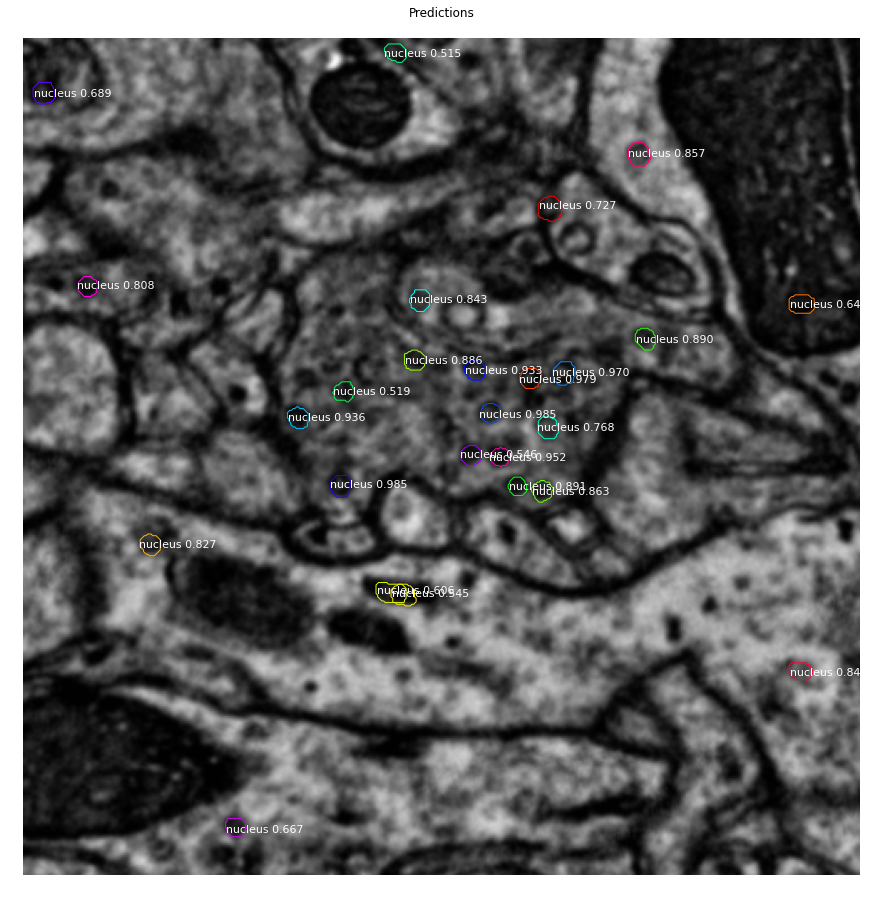

<Figure size 432x288 with 0 Axes>

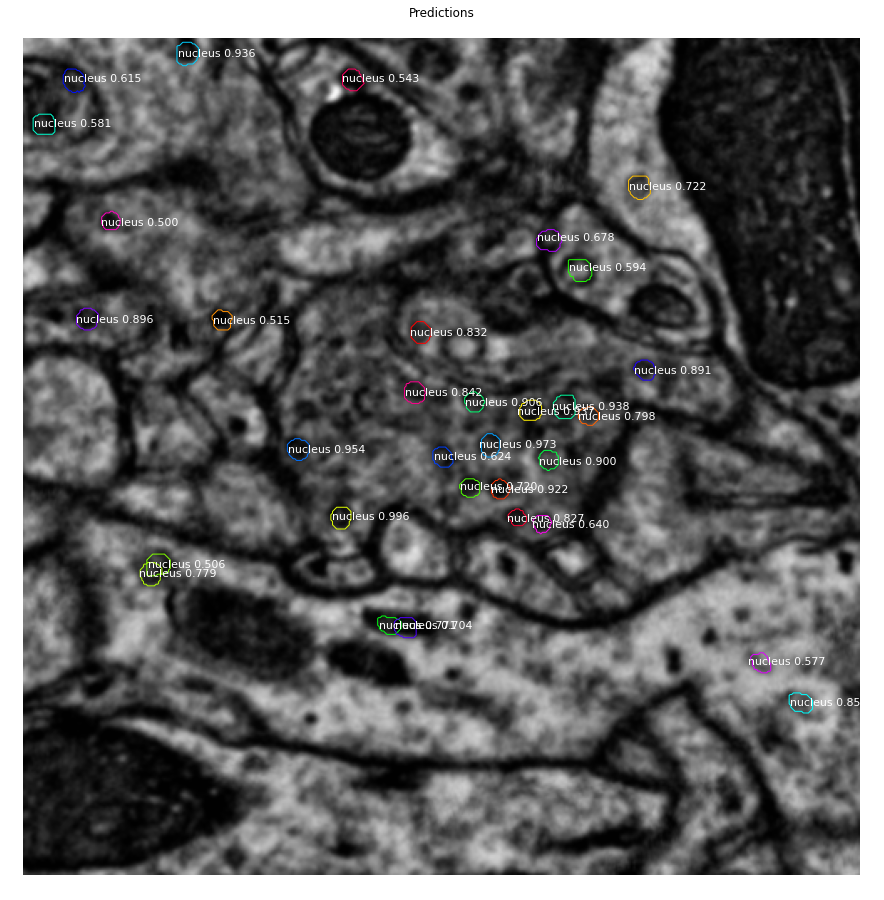

<Figure size 432x288 with 0 Axes>

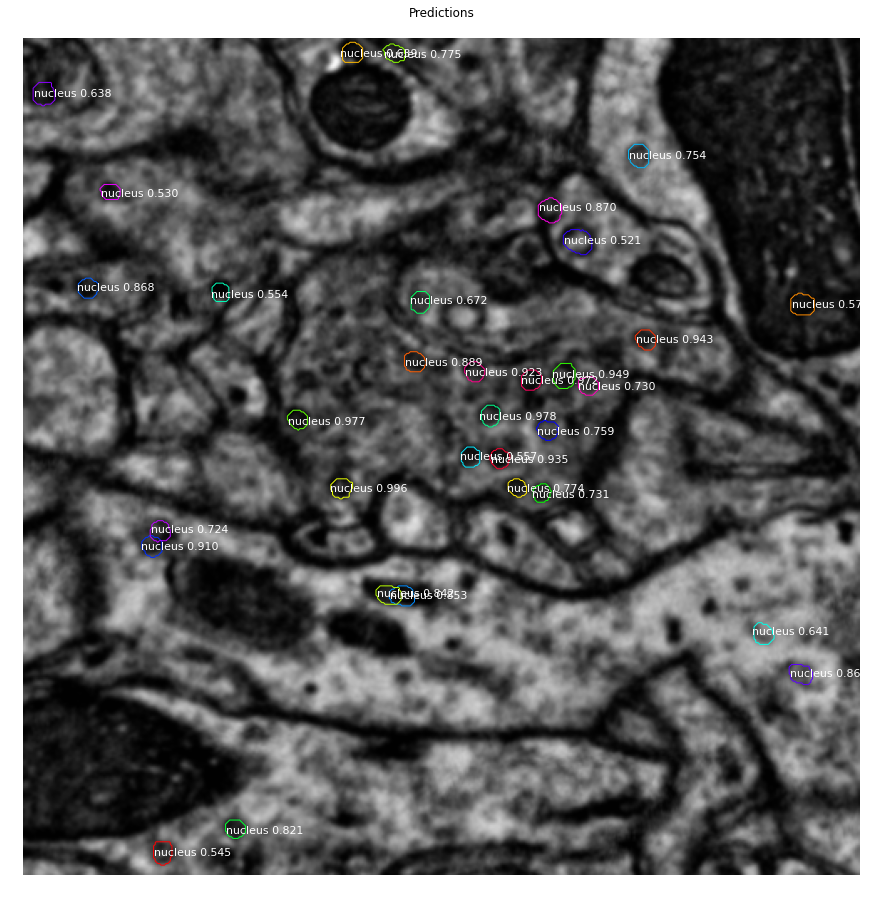

<Figure size 432x288 with 0 Axes>

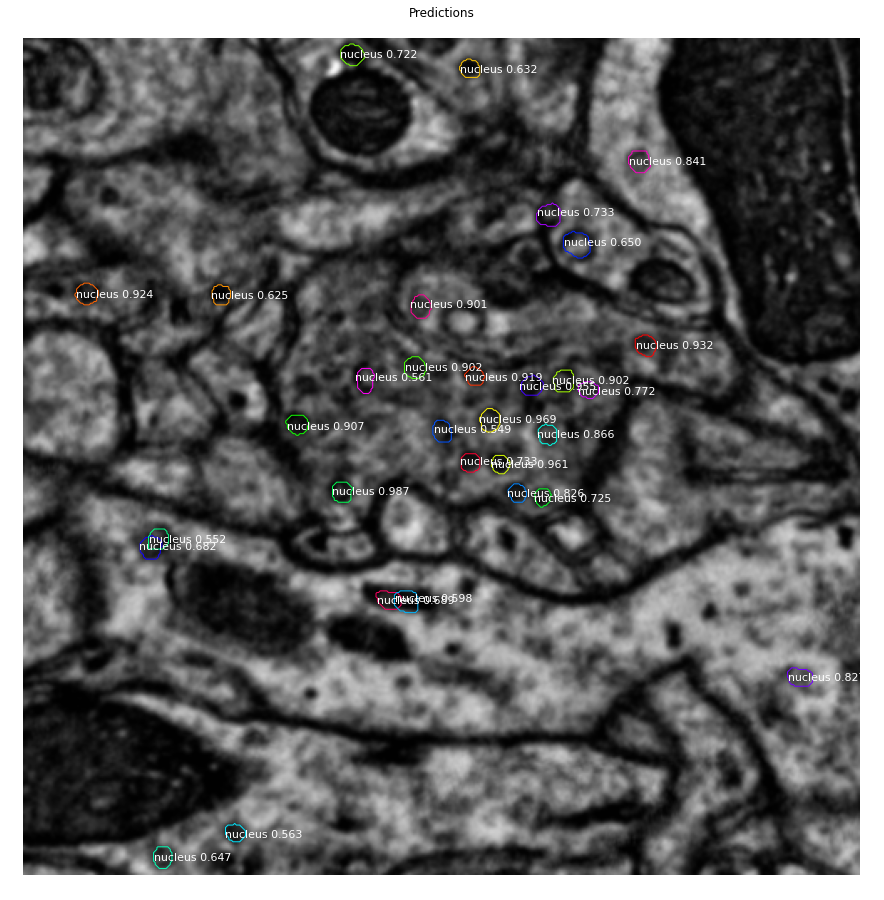

<Figure size 432x288 with 0 Axes>

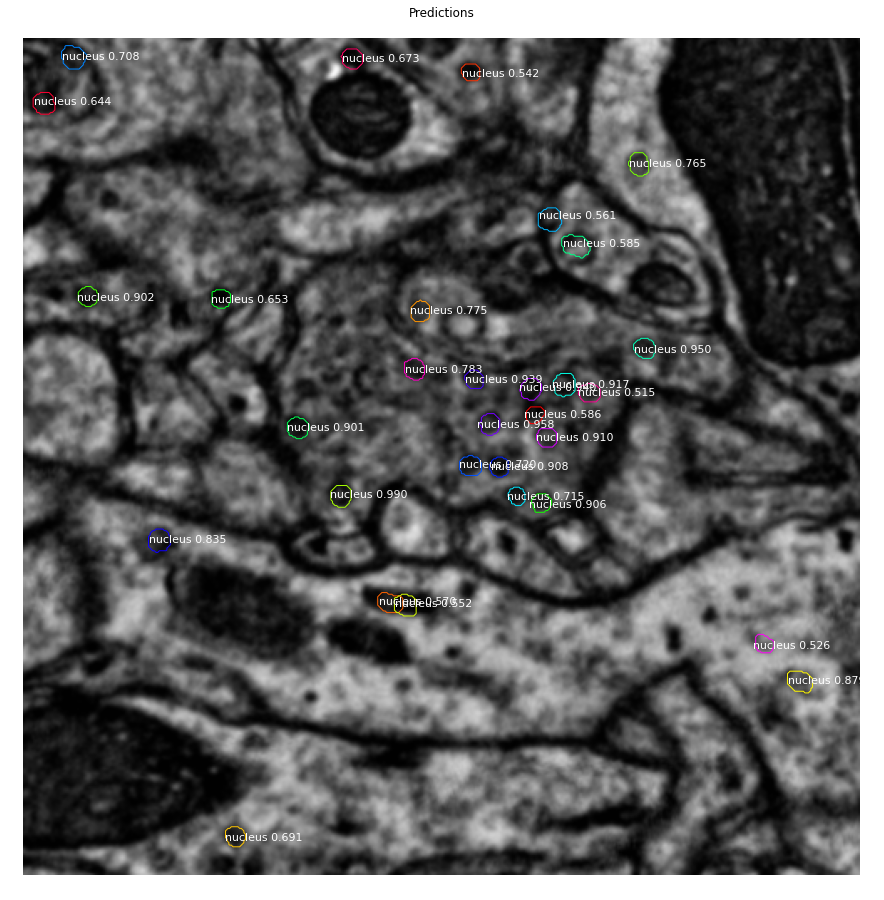

<Figure size 432x288 with 0 Axes>

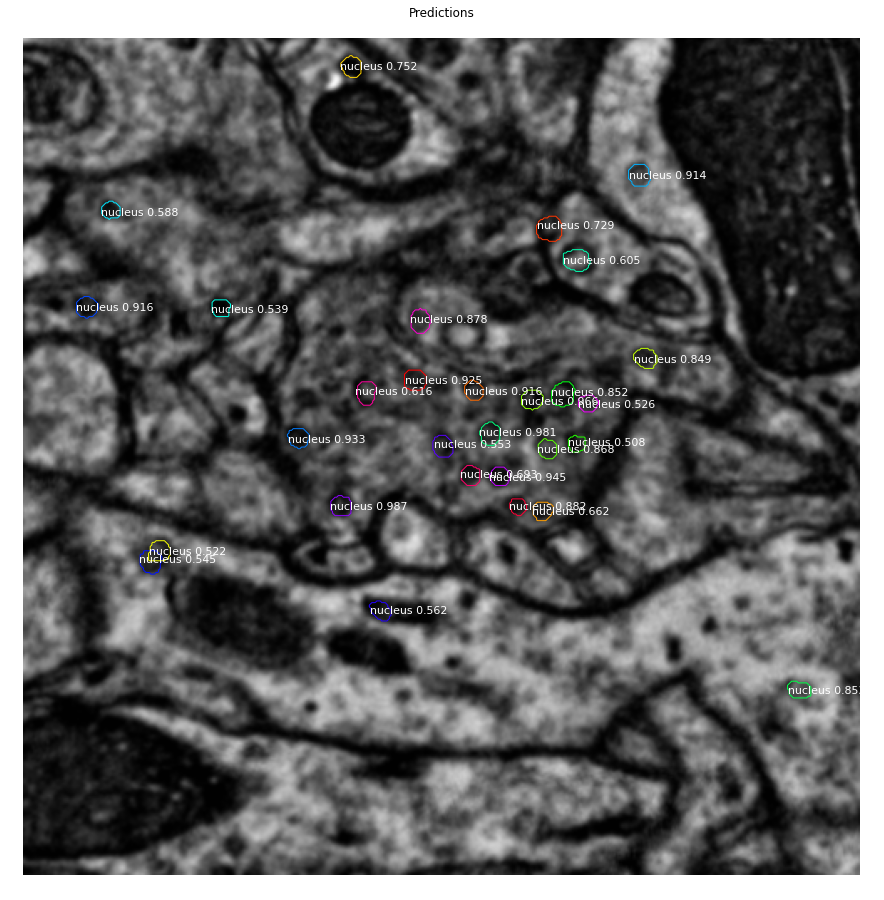

<Figure size 432x288 with 0 Axes>

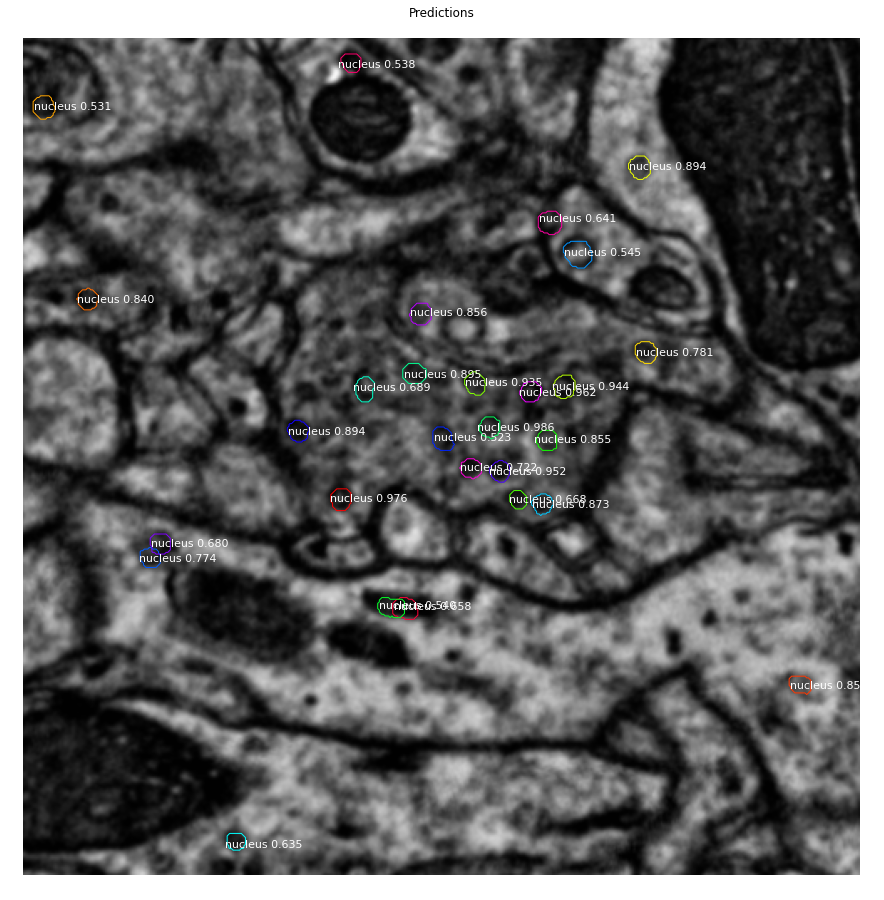

<Figure size 432x288 with 0 Axes>

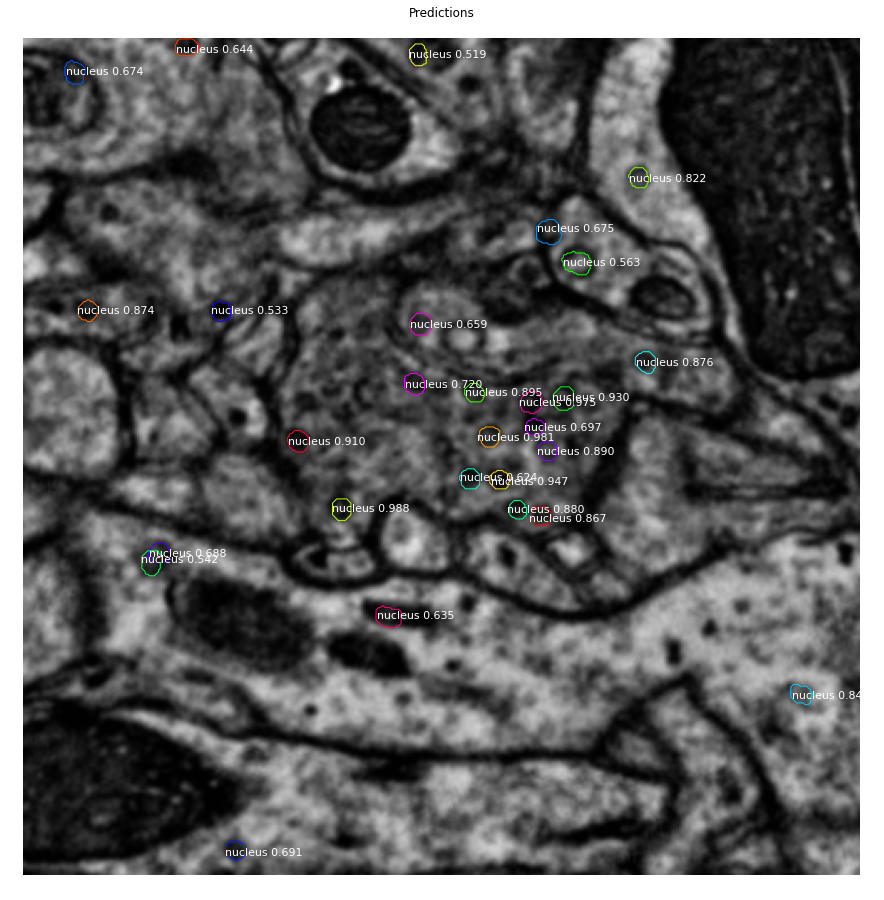

<Figure size 432x288 with 0 Axes>

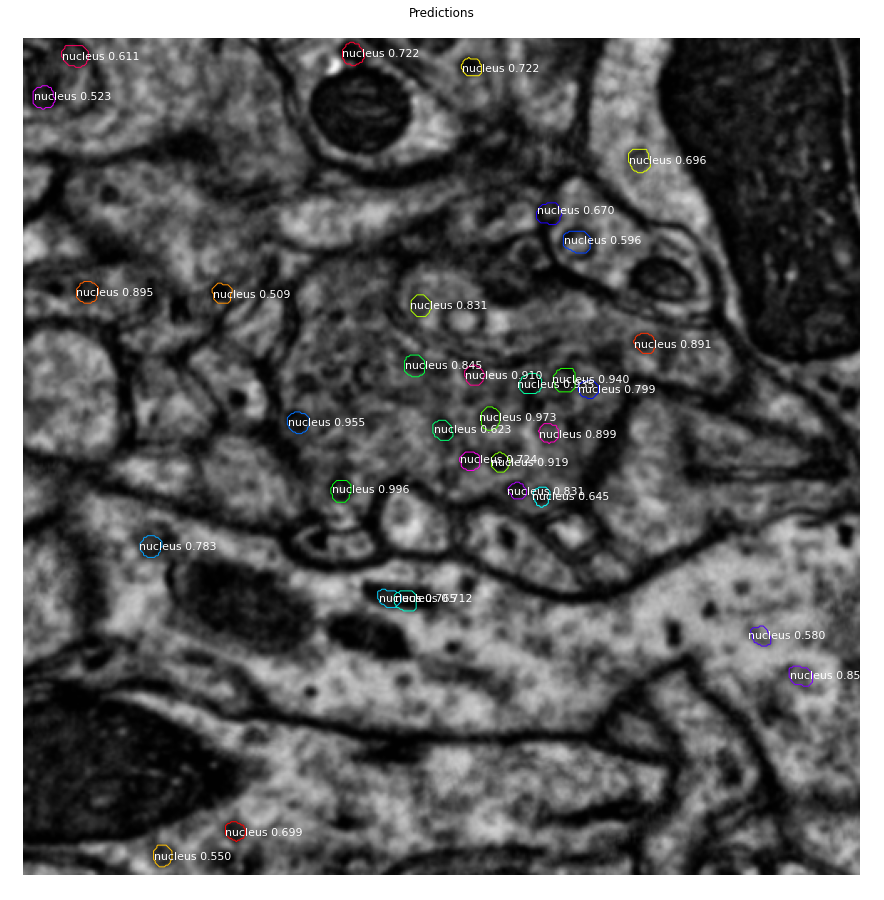

<Figure size 432x288 with 0 Axes>

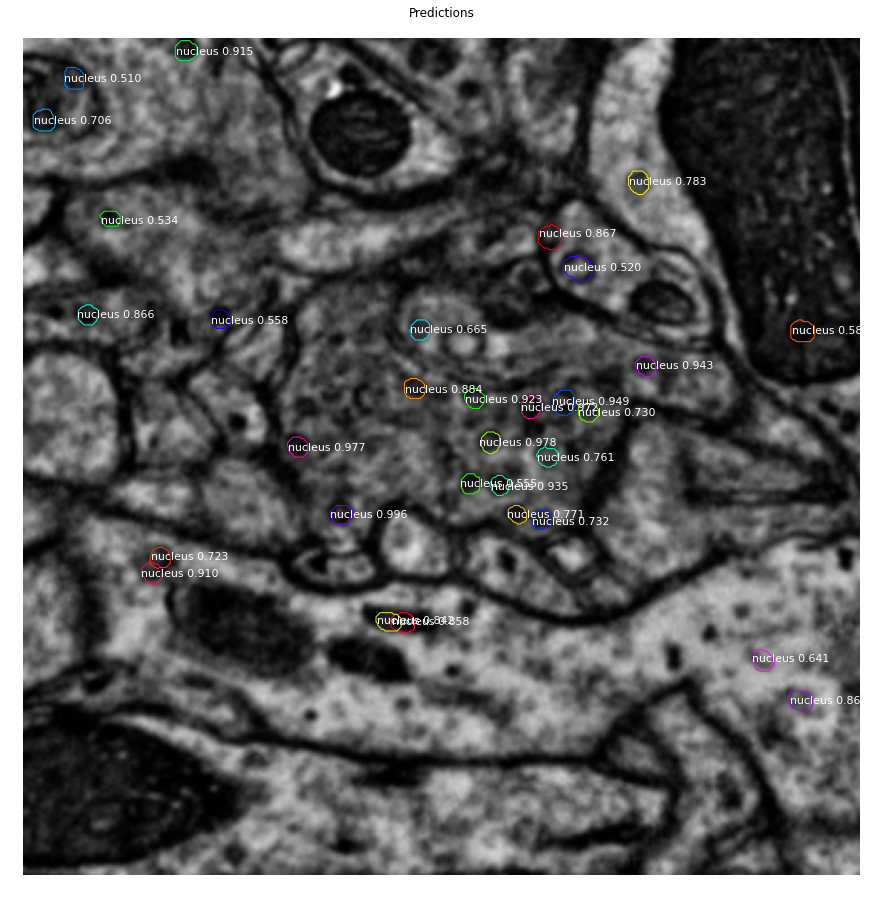

<Figure size 432x288 with 0 Axes>

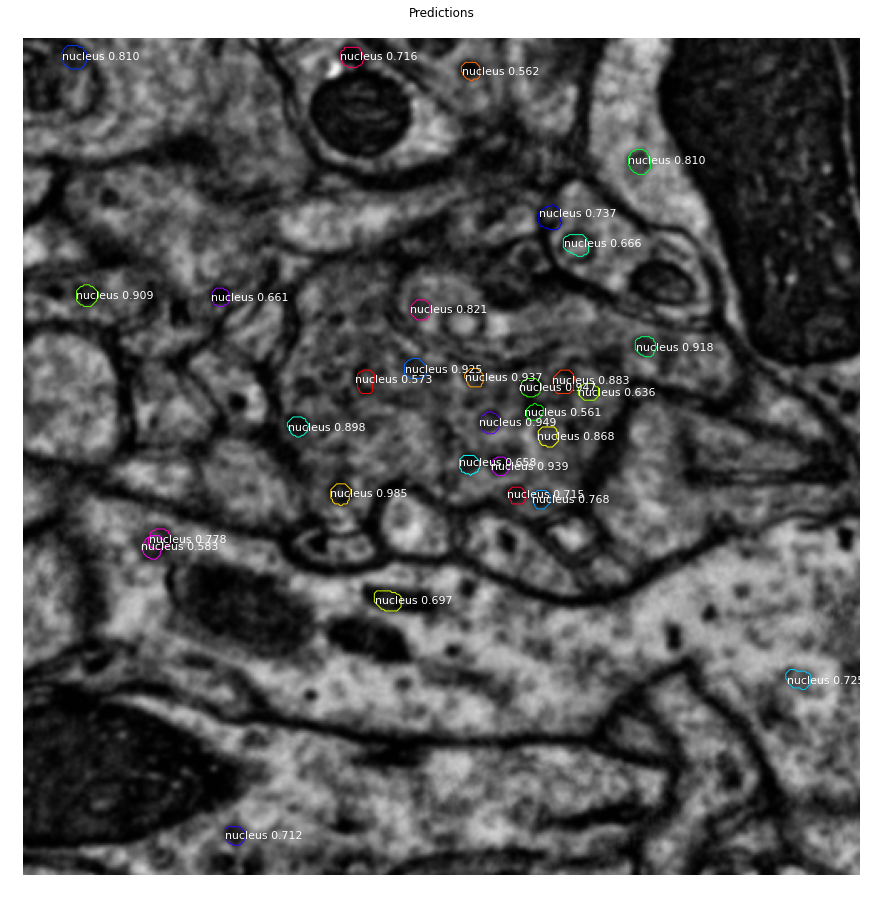

<Figure size 432x288 with 0 Axes>

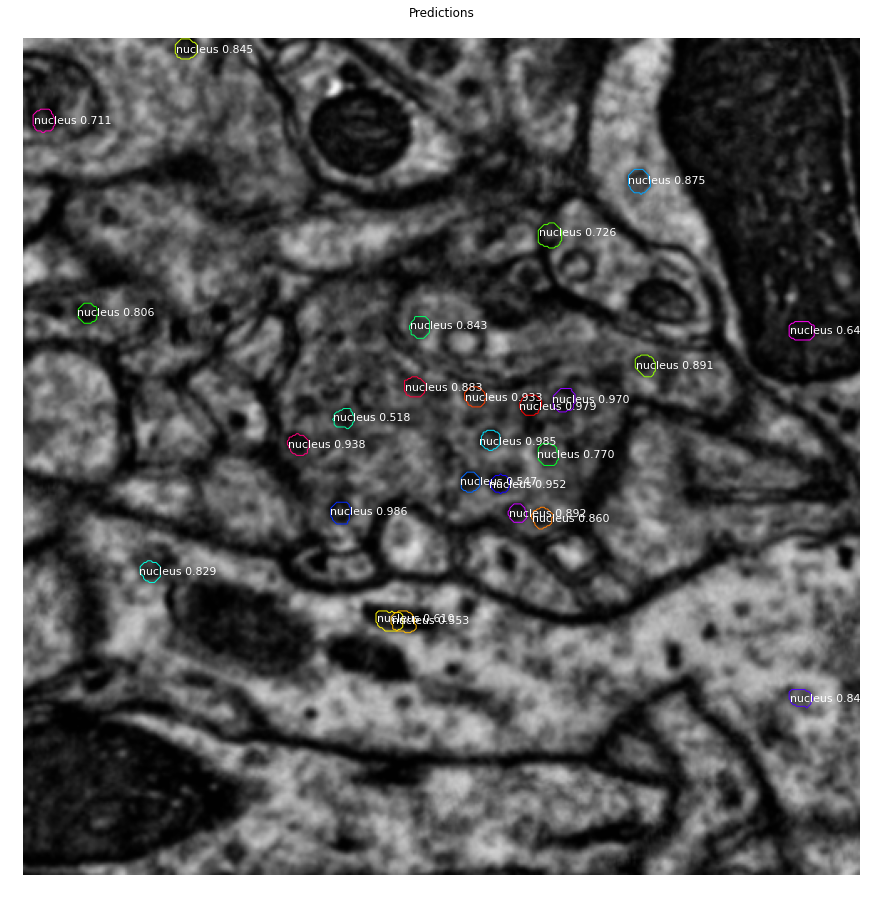

<Figure size 432x288 with 0 Axes>

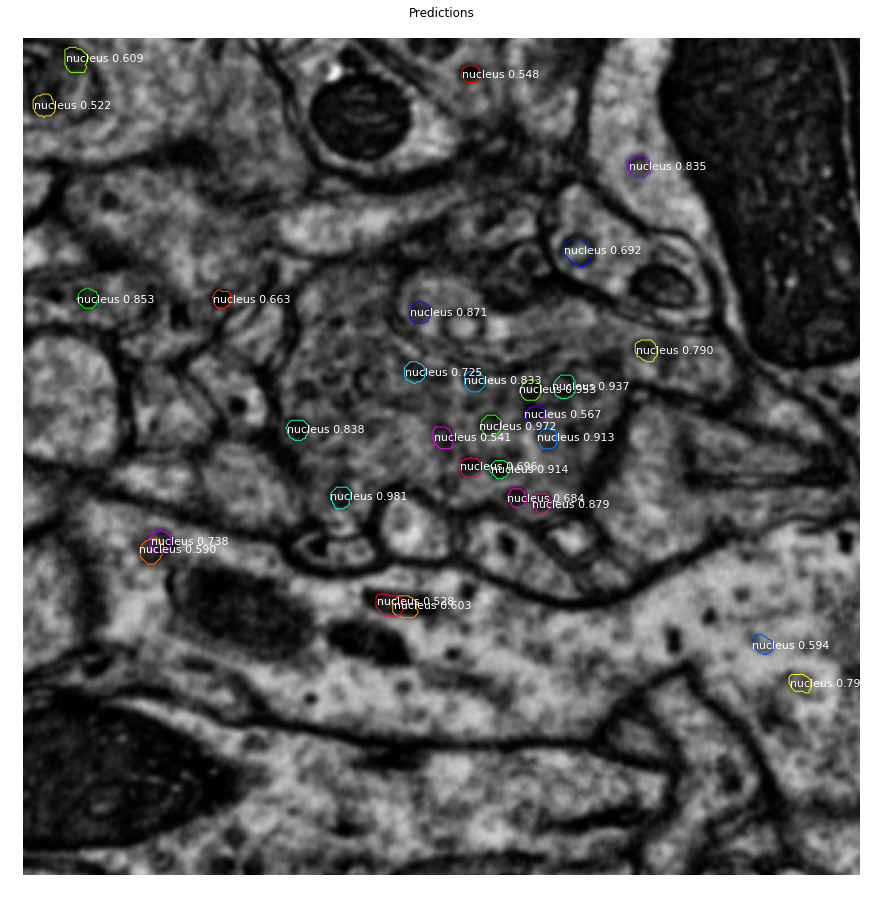

<Figure size 432x288 with 0 Axes>

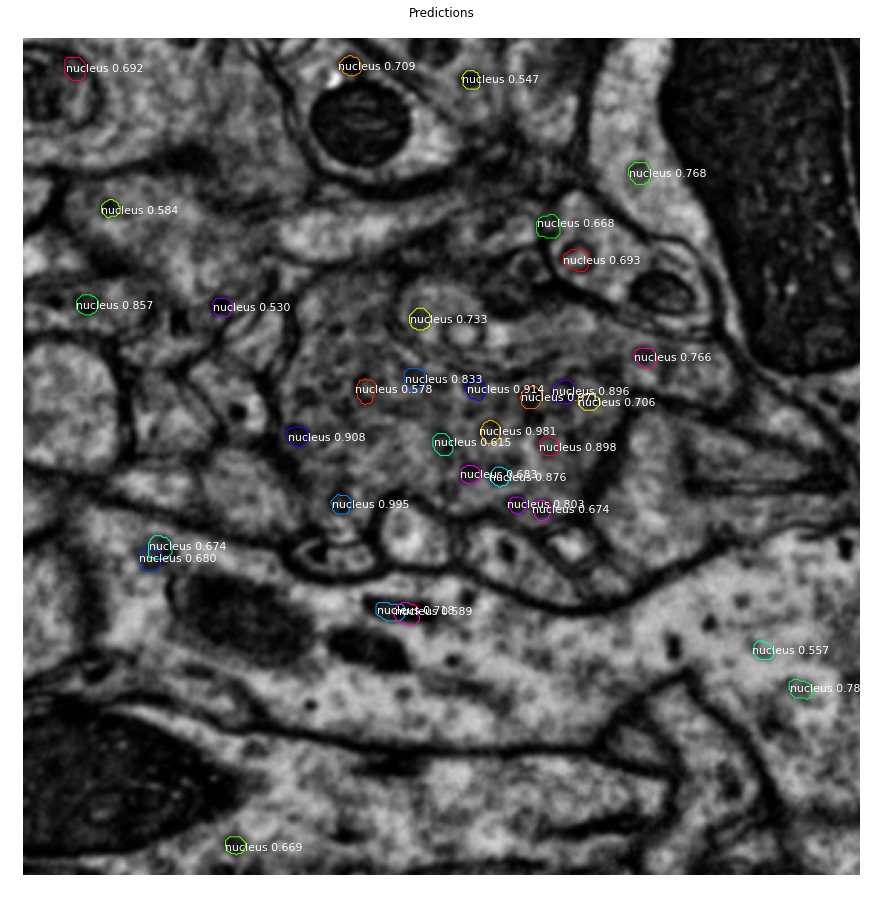

<Figure size 432x288 with 0 Axes>

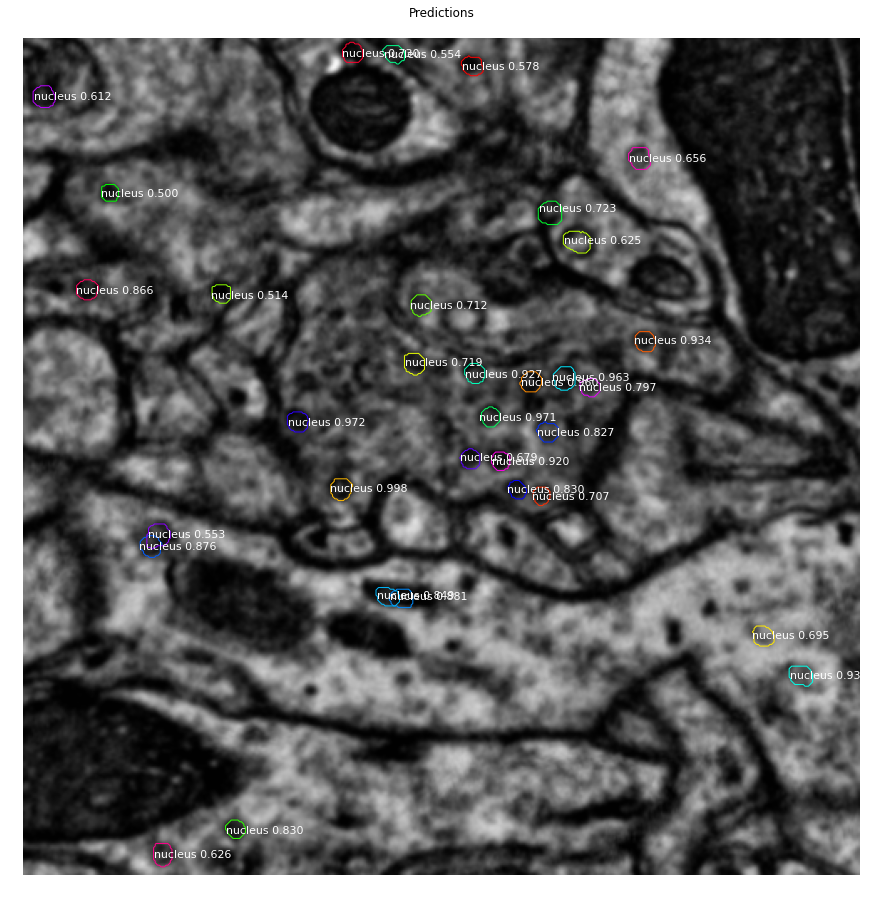

<Figure size 432x288 with 0 Axes>

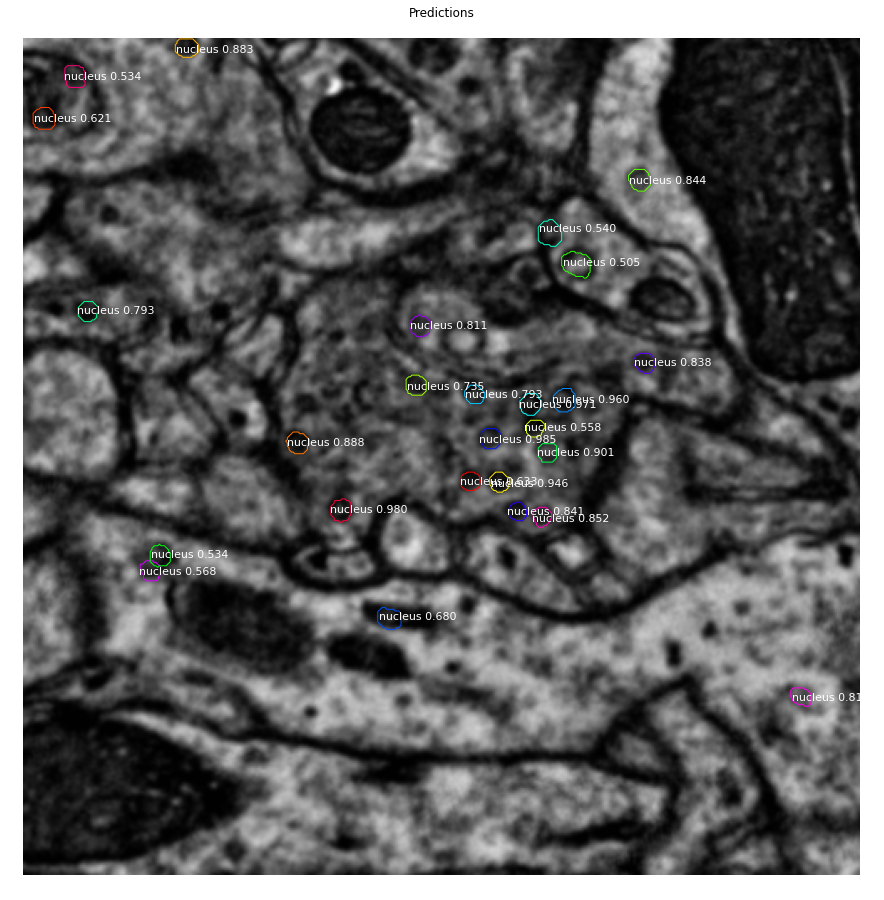

Saved to  /allen/programs/braintv/workgroups/neuralcoding/Parastoo/Mask_RCNN/results/nucleus/submit_20201019T145458


<Figure size 432x288 with 0 Axes>

In [9]:
nucleus.detect(model, DATASET_DIR, 'TD_shift')

## BECAREFUL NOT TO RESET THE DATAFRAME

In [19]:
#### DEFINE THE META DATA FRAME 

ves_nglui = pd.DataFrame(columns = ['img_id', 'area_vox', 'ctr_pts', 'p_score'])

## Run Detection

In [45]:
# dataset_name = '256'
# dir_nm = '2nd'
# dir_path = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/ovlp_{}/'.format(dataset_name)
# ves_path = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/{}/meta_data.csv'.format(dataset_name, dir_nm)

In [20]:
dir_path = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/RL_shift/'
ves_path = '/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/RLshift/meta_data_65.csv'

In [21]:
from skimage.measure import regionprops
from PIL import Image

def gen_ctr_pts(pred_masks):
    
    ctr_pts = []
    for i in range(pred_masks.shape[2]):
        region = regionprops(pred_masks[:, :, i])
        y, x = region[0].centroid
        ctr_pt = [x, y, 0]
        ctr_pts.append(ctr_pt)
        
    return ctr_pts

def make_results_df(results, img_id):
    
    # define the dataframe and attributes
    df = pd.DataFrame(columns = ['img_id', 'area_vox', 'ctr_pts', 'p_score'])
    pred_masks = results['masks']
    scores = results['scores']
    masks2 = np.reshape(pred_masks > .5, (-1, pred_masks.shape[-1])).astype(np.float32)
    area = np.sum(masks2, axis=0)
    df.p_score = scores
    df.area_vox = area
    df.ctr_pts = gen_ctr_pts(pred_masks.astype(int))
    df.img_id = img_id
    
    return df

    

def save_masks(pred_masks, img_id, dir_path = dir_path, file_exists=True):
    
    
    if file_exists==False:
        os.mkdir(dir_path + img_id + '/' + 'masks')
        pred_path = dir_path + img_id + '/' + 'masks'
    else:
        pred_path = dir_path + img_id + '/' + 'masks'
        
    for i in range(pred_masks.shape[2]):
        mask = pred_masks[:, :, i]
        pil_mask = Image.fromarray(mask)
        pil_mask.save('{}/{}_{}.png'.format(pred_path,img_id,i))
        

for image_id in dataset.image_ids:
    print(image_id)
    img_id = dataset.image_info[image_id]['id']
    print(img_id)
    if img_id not in np.unique(ves_nglui.img_id):
        image = dataset.load_image(image_id)

        # Detect objects
        r = model.detect([image], verbose=0)[0]

        try:
            try:
                df = make_results_df(r, img_id)

            except FileNotFoundError:
                 df = make_results_df(r, img_id, file_exists=False)

            ves_nglui = ves_nglui.append(df)
            ves_nglui.to_csv(ves_path)
            save_masks(r['masks'], img_id)


        except ValueError:
            pass

# for item in range(20):
#     img_id = dataset.image_info[1]['id']
#     print(item)
#     r = model.detect([image], verbose=0)[0]
#     df = make_results_df(r, img_id)
#     ves_nglui = ves_nglui.append(df)
#     ves_nglui.to_csv(ves_path)
#     os.mkdir(dir_path + img_id + '/' + 'masks{}'.format(item))
#     pred_path = dir_path + img_id + '/' + 'masks{}'.format(item)
#     pred_masks = r['masks']
#     for i in range(pred_masks.shape[2]):
#         mask = pred_masks[:, :, i]
#         pil_mask = Image.fromarray(mask)
#         pil_mask.save('{}/{}_{}.png'.format(pred_path,img_id,i))


0
RL_005
1
RL_018
2
RL_020
3
RL_004
4
RL_007
5
RL_015
6
RL_014
7
RL_012
8
RL_011
9
RL_003
10
RL_019
11
RL_009
12
RL_008
13
RL_013
14
RL_002
15
RL_006
16
RL_017
17
RL_001
18
RL_010
19
RL_016


# Calculate VESICLE DATAFRAME

In [22]:
ves_nglui=pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/RLshift/meta_data_65.csv')

In [23]:
ves_nglui.head()

,Unnamed: 0,img_id,area_vox,ctr_pts,p_score
0,0,RL_005,160.0,"[194.76875, 286.4375, 0]",0.990615
1,1,RL_005,152.0,"[308.3092105263158, 222.86184210526315, 0]",0.981756
2,2,RL_005,142.0,"[283.8380281690141, 242.83802816901408, 0]",0.973517
3,3,RL_005,160.0,"[328.05625, 219.45, 0]",0.959096
4,4,RL_005,141.0,"[373.1063829787234, 88.40425531914893, 0]",0.953228


In [24]:
ves_nglui['mask_indx'] = ves_nglui['Unnamed: 0']

In [25]:
ves_nglui.drop(['Unnamed: 0'], axis=1, inplace=True)

In [26]:
ves_nglui

,img_id,area_vox,ctr_pts,p_score,mask_indx
0,RL_005,160.0,"[194.76875, 286.4375, 0]",0.990615,0
1,RL_005,152.0,"[308.3092105263158, 222.86184210526315, 0]",0.981756,1
2,RL_005,142.0,"[283.8380281690141, 242.83802816901408, 0]",0.973517,2
3,RL_005,160.0,"[328.05625, 219.45, 0]",0.959096,3
4,RL_005,141.0,"[373.1063829787234, 88.40425531914893, 0]",0.953228,4
...,...,...,...,...,...
582,RL_016,134.0,"[200.044776119403, 215.0, 0]",0.712822,23
583,RL_016,137.0,"[236.23357664233578, 141.36496350364965, 0]",0.579650,24
584,RL_016,134.0,"[354.15671641791045, 224.32089552238807, 0]",0.548367,25
585,RL_016,153.0,"[348.0522875816994, 247.00653594771242, 0]",0.537443,26


lower_bound = ([[72328, 72718,  1380], [72828, 73218,  1381]])
for row in range(660):
    ves_nglui.loc[row, 'gl_ctr_pts'] =  str(list(np.array(eval(ves_nglui.loc[row, 'ctr_pts'])) + lower_bound[0]))


gl_ctr_pts

ves_nglui

In [47]:
# ves_nglui.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/one_img/meta_data2.csv')

In [85]:
# ves_nglui=pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/{}/meta_data.csv'.format(dataset_name, dir_nm), usecols = ['img_id', 'area_vox', 'ctr_pts', 'p_score'])

In [85]:
# ves_nglui.head()

# ves_nglui.shape

# global_coo = pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/bbox_ovlp{}.csv'.format(dataset_name, dataset_name),  index_col=None, usecols=['img_id', 'lower_bound', 'upper_bound'])

In [27]:
dataset_name ='RLshift'

In [28]:
ves_nglui=pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/{}/meta_data_65.csv'.format(dataset_name), 
                      usecols = ['img_id', 'area_vox', 'ctr_pts', 'p_score'])
global_coo = pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/{}/bbox_{}.csv'.format(dataset_name, dataset_name),  
                         index_col=None, usecols=['img_id', 'lower_bound', 'upper_bound'])
global_coo.lower_bound = [eval(bound) for bound in global_coo.lower_bound]

global_coo.head()

ves_nglui['radius'] = np.sqrt(ves_nglui.area_vox/np.pi)

ves_nglui['lower_bound'] = np.nan

for img_id in np.unique(ves_nglui.img_id):
    lower_bound = global_coo.loc[global_coo.img_id == img_id, 'lower_bound']
    ves_nglui.loc[ves_nglui.img_id == img_id, 'lower_bound'] = str(lower_bound.values)

ves_nglui

for row in range(len(ves_nglui)):
    ves_nglui.loc[row, 'gl_ctr_pts'] = str(list(np.array(eval(ves_nglui.loc[row, 'ctr_pts'])) +eval(ves_nglui.loc[row, 'lower_bound'])[0]))

ves_nglui.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/{}/meta_data2_65.csv'.format(dataset_name))

# ves_nglui.lower_bound = [eval(x) for x in ves_nglui.lower_bound]
# ves_nglui.ctr_pts = [eval(x) for x in ves_nglui.ctr_pts]

# for row in range(len(ves_nglui)):
#     ves_nglui.loc[row, 'gl_ctr_pts'] = str(list(np.array(ves_nglui.loc[row, 'ctr_pts']) + ves_nglui.loc[row, 'lower_bound'][0]))
#     print(np.array(ves_nglui.loc[row, 'ctr_pts']) + ves_nglui.loc[row, 'lower_bound'][0])

In [20]:
inner_frame = pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/inner_bbox_ovlp{}.csv'.format(dataset_name, dataset_name),  index_col=None, usecols=['img_id', 'lower_bound', 'upper_bound'])

inner_frame.head()

inner_frame.lower_bound = [eval(x) for x in inner_frame.lower_bound]

inner_frame.upper_bound = [eval(x) for x in inner_frame.upper_bound]

for img_id in inner_frame.img_id:
#     print(img_id)
#     ps = [list(eval(p)) for p in ves_nglui.loc[ves_nglui.img_id==img_id, 'gl_ctr_pts'].values]
    ps = ves_nglui.loc[ves_nglui.img_id==img_id, 'gl_ctr_pts'].values
    ps = [eval(p) for p in ps]
    l, u = inner_frame.loc[inner_frame.img_id==img_id, ['lower_bound', 'upper_bound']].values[0]
    index = 0
    inside_arr = []
    for p in ps:
        if (np.array(p) >= np.array(l)).all() and (np.array(p) <= np.array(u)).all():
            inside = 1
#             print('inside')
#             print(p - np.array(u))
        elif (np.array(p) <  np.array(l)).all() and (np.array(p) < np.array(u)).all():
            inside = 0
#             print('lower_outside')
#             print(p - np.array(l))
#             print(p - np.array(u))
        else:
            inside = 0
#             print('upper_outside')
#             print(p - np.array(l))
#             print(p - np.array(u))
#         print('{}, {}'.format(img_id, index))
        inside_arr.append(inside)
        index +=1
    ves_nglui.loc[ves_nglui.img_id==img_id, 'inside'] = inside_arr



# ves_nglui.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/{}/all_pts_ovlp{}.csv'.format(dataset_name, dir_nm, dataset_name))

# filtered_df = ves_nglui[ves_nglui.inside==1]
# filtered_df.gl_ctr_pts = [str(item) for item in filtered_df.gl_ctr_pts]
# tossed_df = ves_nglui[ves_nglui.inside==0]
# tossed_df.gl_ctr_pts = [str(item) for item in tossed_df.gl_ctr_pts]
# filtered_df
# tossed_df.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/{}/tossed_pts_ovlp{}.csv'.format(dataset_name, dir_nm, dataset_name))
# filtered_df.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp{}/{}/filtered_pts_ovlp{}.csv'.format(dataset_name, dir_nm, dataset_name))

NameError: name 'dataset_name' is not defined

In [102]:
tossed_df

,img_id,area_vox,ctr_pts,p_score,radius,lower_bound,gl_ctr_pts,inside
0,333_001,126.0,"[72.83333333333333, 109.16666666666667, 0]",0.989844,6.333012,"[list([72137, 72871, 1381])]","[72209.83333333333, 72980.16666666667, 1381.0]",0.0
1,333_001,142.0,"[115.1056338028169, 12.190140845070422, 0]",0.989080,6.723095,"[list([72137, 72871, 1381])]","[72252.10563380281, 72883.19014084506, 1381.0]",0.0
2,333_001,163.0,"[302.3558282208589, 407.60736196319016, 0]",0.980820,7.203090,"[list([72137, 72871, 1381])]","[72439.35582822085, 73278.6073619632, 1381.0]",0.0
3,333_001,122.0,"[369.58196721311475, 449.6885245901639, 0]",0.980787,6.231678,"[list([72137, 72871, 1381])]","[72506.58196721312, 73320.68852459016, 1381.0]",0.0
4,333_001,144.0,"[436.47222222222223, 86.09027777777777, 0]",0.979541,6.770275,"[list([72137, 72871, 1381])]","[72573.47222222222, 72957.09027777778, 1381.0]",0.0
...,...,...,...,...,...,...,...,...
255,333_005,129.0,"[454.6589147286822, 58.310077519379846, 0]",0.708768,6.407962,"[list([72137, 73127, 1381])]","[72591.65891472869, 73185.31007751937, 1381.0]",0.0
256,333_005,114.0,"[500.9298245614035, 205.83333333333334, 0]",0.645540,6.023896,"[list([72137, 73127, 1381])]","[72637.9298245614, 73332.83333333333, 1381.0]",0.0
259,333_005,164.0,"[434.0, 243.5, 0]",0.561145,7.225152,"[list([72137, 73127, 1381])]","[72571.0, 73370.5, 1381.0]",0.0
260,333_005,111.0,"[394.8918918918919, 91.46846846846847, 0]",0.558618,5.944106,"[list([72137, 73127, 1381])]","[72531.8918918919, 73218.46846846846, 1381.0]",0.0


In [103]:
filtered_df

,img_id,area_vox,ctr_pts,p_score,radius,lower_bound,gl_ctr_pts,inside
17,333_001,130.0,"[186.02307692307693, 319.0692307692308, 0]",0.854060,6.432751,"[list([72137, 72871, 1381])]","[72323.02307692308, 73190.06923076924, 1381.0]",1.0
20,333_001,167.0,"[226.7125748502994, 381.5688622754491, 0]",0.842163,7.290936,"[list([72137, 72871, 1381])]","[72363.7125748503, 73252.56886227545, 1381.0]",1.0
30,333_001,135.0,"[329.4, 281.0074074074074, 0]",0.745811,6.555291,"[list([72137, 72871, 1381])]","[72466.4, 73152.00740740741, 1381.0]",1.0
35,333_001,154.0,"[369.7012987012987, 366.7077922077922, 0]",0.715640,7.001409,"[list([72137, 72871, 1381])]","[72506.7012987013, 73237.70779220779, 1381.0]",1.0
39,333_001,105.0,"[373.0, 165.14285714285714, 0]",0.688345,5.781223,"[list([72137, 72871, 1381])]","[72510.0, 73036.14285714286, 1381.0]",1.0
45,333_001,115.0,"[304.0782608695652, 360.55652173913046, 0]",0.591357,6.050259,"[list([72137, 72871, 1381])]","[72441.07826086956, 73231.55652173913, 1381.0]",1.0
50,333_001,156.0,"[206.60897435897436, 311.68589743589746, 0]",0.510755,7.046726,"[list([72137, 72871, 1381])]","[72343.60897435897, 73182.68589743589, 1381.0]",1.0
52,333_006,99.0,"[283.09090909090907, 192.12121212121212, 0]",0.978932,5.613615,"[list([72393, 73127, 1380])]","[72676.09090909091, 73319.12121212122, 1380.0]",1.0
54,333_006,115.0,"[140.9217391304348, 315.02608695652174, 0]",0.939165,6.050259,"[list([72393, 73127, 1380])]","[72533.92173913044, 73442.02608695652, 1380.0]",1.0
55,333_006,120.0,"[133.23333333333332, 191.31666666666666, 0]",0.927196,6.180387,"[list([72393, 73127, 1380])]","[72526.23333333334, 73318.31666666667, 1380.0]",1.0


In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

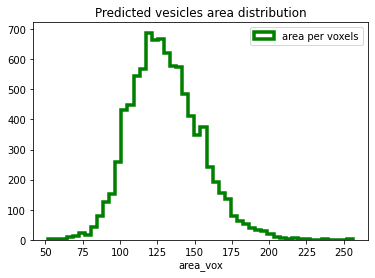

In [57]:
plt.hist(filtered_df['area_vox'], bins=50, histtype='step', color = 'g', label='area per voxels', lw=3.5)
plt.title('Predicted vesicles area distribution')
plt.legend()
plt.xlabel('area_vox')
plt.savefig('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Predicted_vesicles_area_distribution.png')

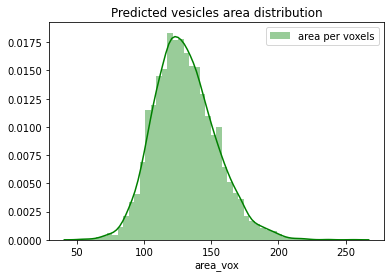

In [56]:
sns.distplot(filtered_df['area_vox'], color = 'g', label='area per voxels')
plt.title('Predicted vesicles area distribution')
plt.legend()
plt.savefig('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/Predicted_vesicles_area_distribution2.png')

In [21]:
filtered_df = pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp250/1st/filtered_pts_ovlp250.csv', 
                          usecols = ['img_id', 'area_vox', 'ctr_pts', 'p_score', 'radius',
                                    'lower_bound', 'gl_ctr_pts', 'inside'])
tossed_df = pd.read_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp250/1st/tossed_pts_ovlp250.csv', 
                          usecols = ['img_id', 'area_vox', 'ctr_pts', 'p_score', 'radius',
                                    'lower_bound', 'gl_ctr_pts', 'inside'])

In [22]:
filtered_df.head()

,img_id,area_vox,ctr_pts,p_score,radius,lower_bound,gl_ctr_pts,inside
0,333_001,130.0,"[186.02307692307693, 319.0692307692308, 0]",0.854060,6.432751,"[list([72137, 72871, 1381])]","[72323.02307692308, 73190.06923076924, 1381.0]",1.0
1,333_001,167.0,"[226.7125748502994, 381.5688622754491, 0]",0.842163,7.290936,"[list([72137, 72871, 1381])]","[72363.7125748503, 73252.56886227545, 1381.0]",1.0
2,333_001,135.0,"[329.4, 281.0074074074074, 0]",0.745811,6.555291,"[list([72137, 72871, 1381])]","[72466.4, 73152.00740740741, 1381.0]",1.0
3,333_001,154.0,"[369.7012987012987, 366.7077922077922, 0]",0.715640,7.001409,"[list([72137, 72871, 1381])]","[72506.7012987013, 73237.70779220779, 1381.0]",1.0
4,333_001,105.0,"[373.0, 165.14285714285714, 0]",0.688345,5.781223,"[list([72137, 72871, 1381])]","[72510.0, 73036.14285714286, 1381.0]",1.0


In [24]:
tossed_df.head()

,img_id,area_vox,ctr_pts,p_score,radius,lower_bound,gl_ctr_pts,inside
0,333_001,126.0,"[72.83333333333333, 109.16666666666667, 0]",0.989844,6.333012,"[list([72137, 72871, 1381])]","[72209.83333333333, 72980.16666666667, 1381.0]",0.0
1,333_001,142.0,"[115.1056338028169, 12.190140845070422, 0]",0.989080,6.723095,"[list([72137, 72871, 1381])]","[72252.10563380281, 72883.19014084506, 1381.0]",0.0
2,333_001,163.0,"[302.3558282208589, 407.60736196319016, 0]",0.980820,7.203090,"[list([72137, 72871, 1381])]","[72439.35582822085, 73278.6073619632, 1381.0]",0.0
3,333_001,122.0,"[369.58196721311475, 449.6885245901639, 0]",0.980787,6.231678,"[list([72137, 72871, 1381])]","[72506.58196721312, 73320.68852459016, 1381.0]",0.0
4,333_001,144.0,"[436.47222222222223, 86.09027777777777, 0]",0.979541,6.770275,"[list([72137, 72871, 1381])]","[72573.47222222222, 72957.09027777778, 1381.0]",0.0


In [26]:
np.unique(filtered_df.img_id)

array(['333_000', '333_001', '333_002', '333_003', '333_004', '333_005',
       '333_006', '333_007'], dtype=object)

In [29]:
for item in np.unique(filtered_df.img_id):
    df = tossed_df[tossed_df.img_id == item]
    df.to_csv('/allen/programs/braintv/workgroups/neuralcoding/Parastoo/debugging_network/ovlp250/1st/tossed_{}.csv'.format(item))

In [1]:
from imgaug import augmenters as iaa

In [3]:
import matplotlib.pyplot as plt

In [ ]:
img = 

In [ ]:
iaa.size.CropAndPad()